qPCR work-flow for single cell data analysis
===========================
_Data Set_
---------------

The cells were lysed, reverse transcriped, pre-amplified and anlayzed with qPCR using the BioMark qPCR platform (Fluidigm). The dataset represents qPCR for single-cells with respect to distribution of transcripts in those cells and gene expression levels. The experiment was conducted on a 96X96 well plate to capture 96 genes from 96 cells. The dataset is modified to include the information on number of cells captured positively and identifying the house-keeping genes. The column names were renamed to CellName with cells and GeneName to mark the genes. The data are then saved in a _csv_ file.

In [41]:
library(made4)
library(impute)
library(repr)

In [1]:

# Reading data from CSV file
data <- read.csv("Amanda_single_cell_MCF10a_96_genes_modified.csv",check.names=FALSE,row.names=1)

In [9]:
head(data)

,cells,CellName,Type,rConc,GeneName,Type,Value,Quality,Call,Threshold,In Range,Out Range,Peak Ratio
S03-A75,1,C01,Unknown,1,ANKRD37,Test,25.39857,0.98,Pass,0.01689175,90.06323,999,1
S02-A75,1,C02,Unknown,1,ANKRD37,Test,19.36336,0.89,Pass,0.01689175,88.22508,999,1
S01-A75,1,C03,Unknown,1,ANKRD37,Test,25.51632,0.69,Pass,0.01689175,89.66574,999,1
S09-A75,1,C04,Unknown,1,ANKRD37,Test,18.77383,0.91,Pass,0.01689175,87.95165,999,1
S08-A75,1,C05,Unknown,1,ANKRD37,Test,17.09257,0.89,Pass,0.01689175,88.03647,999,1
S07-A75,1,C06,Unknown,1,ANKRD37,Test,18.4161,0.89,Pass,0.01689175,88.02838,999,1


We then created a list of valid cells. We look at all the cell capture images using [___ImageJ___](http://imagej.nih.gov/ij/) software. Some cells were not captured at all and some wells capture sometimes more than once cell. We put a zero for a cell that is not captured and number of cells for the cells that were captured. For this analysis 76 cells were captured as single cell and 4 cells were captured double. For our data analsyis we considered these 80 cells as valid cells. The data for the remaining 16 cells were omitted.

In [5]:
mydata <- data
# Creating an empty list to hold all the cells
myListCell <- list()
myListCell <- split(data , f = data$CellName )

# Holds all the Genes                                                  
myListGene <- list()
myListGene <- split(data , f = data$GeneName )

invalidCellIndex <- unlist(lapply(myListCell, function(y){if(y[1,1] == 0)y[1,2]}))
validCellIndex <- unlist(lapply(myListCell, function(y){if(y[1,1] != 0)y[1,2]}))

# Lists all the valid cells                                                        
myListValidCell <- myListCell[validCellIndex]
#mylistValidGene <- lapply(myListGene, function(y){y[validCellIndex,]})



We then extracted all the cells name and gene name

In [6]:
GenName <- myListCell[[1]][,5]
CellName <- myListGene[[1]][,2]

Next we take out the Ct (Cycle Threshold) values for all the genes from valid cells. 

In [7]:
CtValidCells <- (matrix(unlist(lapply(myListCell[validCellIndex], function(y)y[,7])), ncol=96, byrow=TRUE))
CtValidCells[CtValidCells == 999] <- NA
rownames(CtValidCells) <- CellName[validCellIndex]
colnames(CtValidCells) <- GenName

We also do this for all the cells as well

In [8]:
#Ct <- simplify2array(unlist(lapply(mylist, function(y)y[,6])))
Ct <- (matrix(unlist(lapply(myListCell, function(y)y[,7])), ncol=96, byrow=TRUE))
Ct [Ct == 999] <- NA
rownames(Ct) <- CellName
colnames(Ct) <- GenName

We then generated a boxplot with the Ct values both from all cells and valid cells. This figure is to be used to find out the threshold value __C\_cutoff__. We find 25 to be a good value as it considers most of the genes

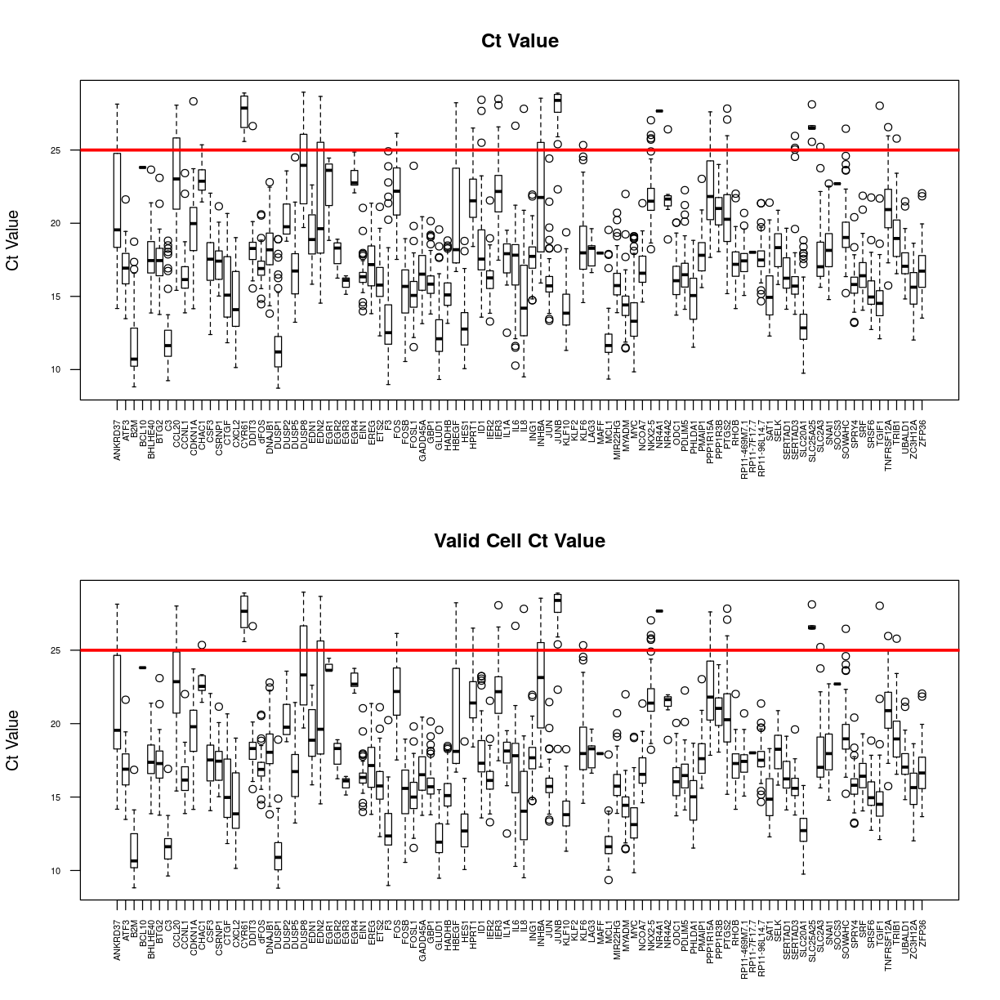

In [66]:
#options(repr.plot.width=10.2, repr.plot.height=10.2)
old.par <- par(mfrow=c(2, 1))
par(cex.axis=0.55)
boxplot(Ct,ylab="Ct Value", names=GenName, las=2,font.axis=0.5)
abline(h=25, col="red", lwd=3)
title("Ct Value")
boxplot(CtValidCells,ylab="Ct Value", names=GenName, las=2)
abline(h=25, col="red", lwd=3)
title("Valid Cell Ct Value")


Very high Ct values are often not reliable even when the instrument has produced the correct the PCR product as these high Ct values indicate very few molecules or even fractions of a molecule that became large due to different problems. They may also be false positives (primer-dimers and other aberrant products). A prgmatic approach would be to delete all the values higher than the Ct value expected for a reaction starting with a single template molecule ($Ct_N=1$). On hight throughput platforms using smaller reaction volumes and more sensitive optics $Ct_N=25$ is a reasonable choise. As we can see from the distribution in the figure above, choosing the threshold value of 25 will consider most of the Ct values for most of the genes.

Missing and off scale data
-----------------------------

The Biomarker instument from the Fludigm instrument assigns a very high value of 999 to report the missing values. There are two distinctly different reasons for a missing value. 1) The reaction chamber contained template molecules but the PCR failed, 2) the reaction did not produce any product because there was no template in that particular reaction chamber. These two different conditions should be dealt with differently. If values from technical replicates are available missing data due to reaction failure can be restored based on replicate information. The simplest approach is to take average of the technical replicates and then replace the NA. A more systemetic approach is to use imputation. Typically, imputation is used when several levels of technical replicates are avaialble. However, in Single-cell experiments technical replicates are usually not available as it is not cost effective. In our analysis we used both the techniques. In one approach we ommitted the missing data. In the other approach we used the K-nearest neighbor (knn) imputation appraoch to replace the Ct values.  

We also ammended the high values in the pre-processing of qPCR data. We preprocessed these data and converted 999 to NA (Not a Number ) in _R_. In R NA values are by default not considered during calculation. 



Selection of Housekeeping Genes
-------------------------------------

As noted by Amanda, there are 5 House Keeping Genes. They are, B2M, C3, GLUD1, HADHB, HPRT1, SRSF6. We plotted the Boxplot for housekeeping Genes with all the cells and with only the valid cells. 

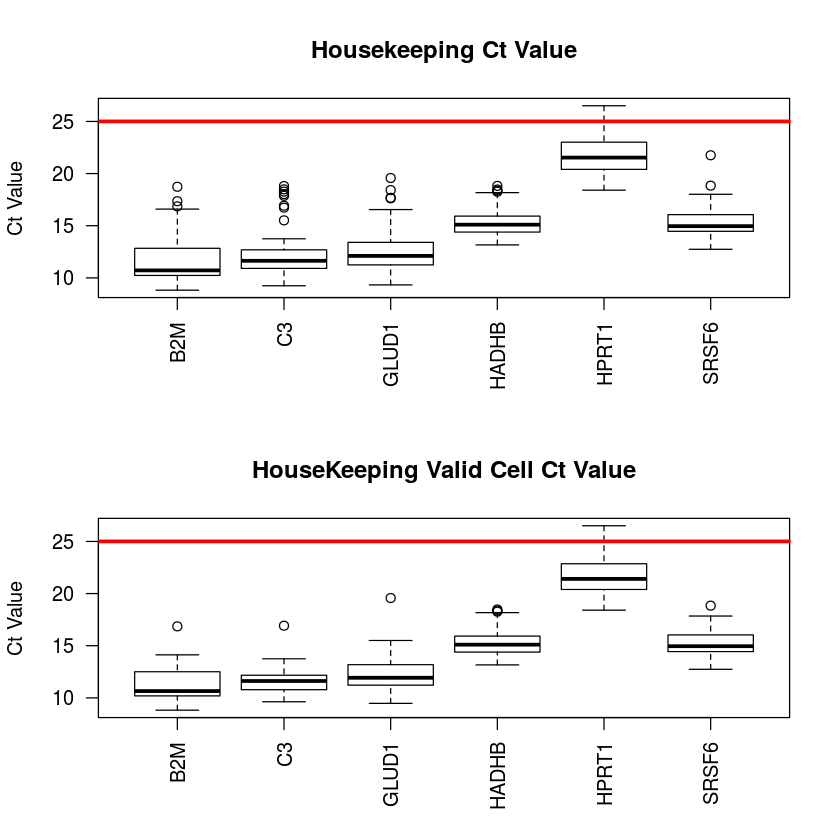

In [19]:
houseKeepGeneIndex <- c(3,7,39,40,43,90)
houseKeepGeneCt <- t(matrix(unlist(lapply(myListGene[houseKeepGeneIndex], function(y)y[,7])), ncol=96, byrow=TRUE))
houseKeepGeneCt[houseKeepGeneCt == 999] <- NA
houseKeepGeneValidCt <- t(matrix(unlist(lapply(mylistValidGene[houseKeepGeneIndex], function(y)y[,7])), ncol=length(validCellIndex), byrow=TRUE))
houseKeepGeneValidCt[houseKeepGeneValidCt == 999] <- NA

old.par <- par(mfrow=c(2, 1))
boxplot(houseKeepGeneCt,ylab="Ct Value", names=GenName[houseKeepGeneIndex], las=2)
abline(h=25, col="red", lwd=3)
title("Housekeeping Ct Value")
boxplot(houseKeepGeneValidCt,ylab="Ct Value", names=GenName[houseKeepGeneIndex], las=2)
abline(h=25, col="red", lwd=3)
title("HouseKeeping Valid Cell Ct Value")

We then try to find out the number of missing values in the house keeping genes for all the valid cells

In [20]:
noOfFaiHouseKeepValidCells <- colSums(is.na(houseKeepGeneValidCt)) 
noOfFaiHouseKeepValidCells

[1] 0 0 0 1 9 1

We find that B2M, C3 and GLUD1 has 0 missing values for all the valid cells. We take these three genes to calculate the relative gene expression calculation using $\Delta C_t$ method.


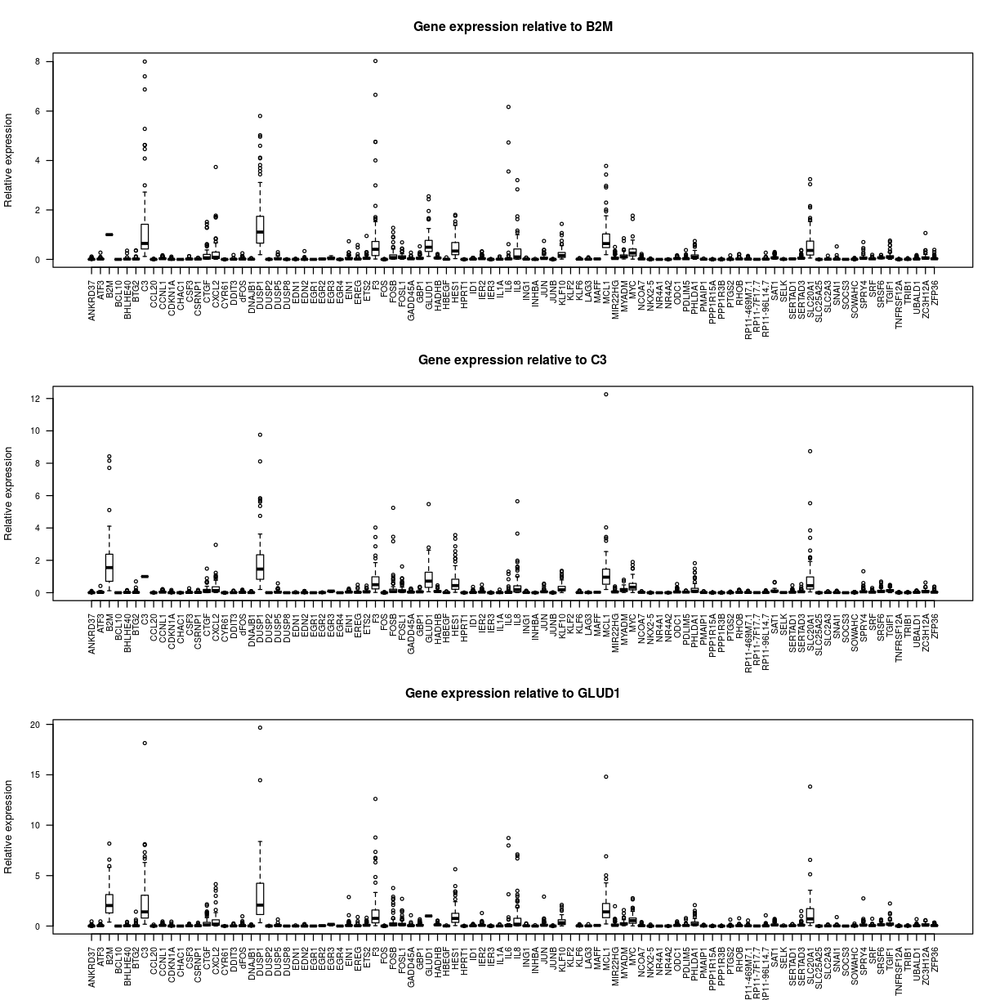

In [68]:
selectedHouseKeepGeneIndex <- 3
deltaCtresB2M <- CtValidCells[,selectedHouseKeepGeneIndex] - CtValidCells
foldChangeB2M <- 2^deltaCtresB2M

selectedHouseKeepGeneIndex <- 7
deltaCtresC3 <- CtValidCells[,selectedHouseKeepGeneIndex] - CtValidCells
foldChangeC3 <- 2^deltaCtresC3

selectedHouseKeepGeneIndex <- 39
deltaCtresGLUD1 <- CtValidCells[,selectedHouseKeepGeneIndex] - CtValidCells
foldChangeGLUD1 <- 2^deltaCtresGLUD1

options(repr.plot.width=10.2, repr.plot.height=10.2)
old.par <- par(mfrow=c(3, 1))
par(cex.axis=0.8)
boxplot(foldChangeB2M,ylab="Relative expression", names=GenName, las=2)
title("Gene expression relative to B2M")
c <- boxplot(foldChangeC3,ylab="Relative expression", names=GenName, las=2)
title("Gene expression relative to C3")
boxplot(foldChangeGLUD1,ylab="Relative expression", names=GenName, las=2)
title("Gene expression relative to GLUD1")

Using the Imputted value
-------------------------------

Warning message:
In knnimp(x, k, maxmiss = rowmax, maxp = maxp): 28 rows with more than 50 % entries missing;
 mean imputation used for these rows

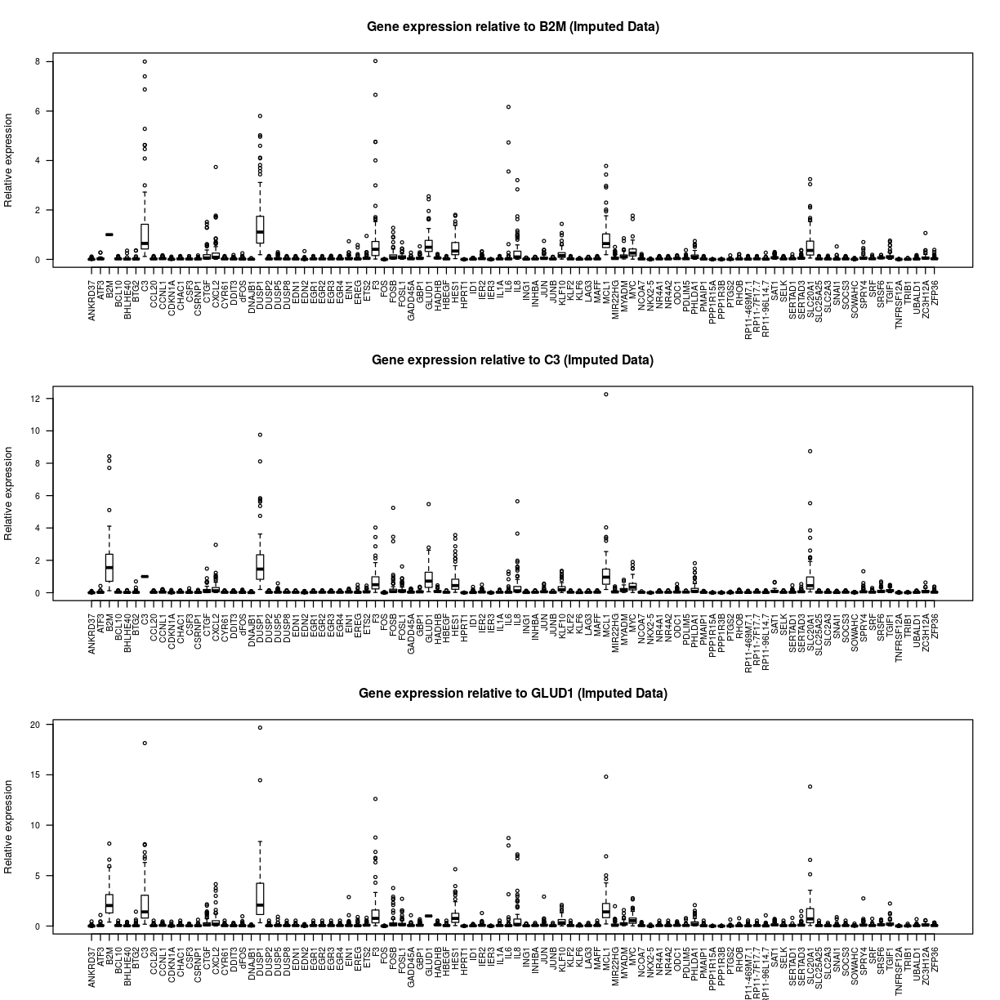

In [70]:
#=================================================================================================
# Imputing the Ct values
#================================================================================================
CtValidCellsImputed <- t(impute.knn(t(CtValidCells))$data)
# Warning message:
#   In knnimp(x, k, maxmiss = rowmax, maxp = maxp) :
#   28 rows with more than 50 % entries missing;
#   mean imputation used for these rows


selectedHouseKeepGeneIndex <- 3
deltaCtresB2MImputed <- CtValidCellsImputed[,selectedHouseKeepGeneIndex] - CtValidCellsImputed
foldChangeB2MImputed <- 2^deltaCtresB2MImputed

selectedHouseKeepGeneIndex <- 7
deltaCtresC3Imputed <- CtValidCellsImputed[,selectedHouseKeepGeneIndex] - CtValidCellsImputed
foldChangeC3Imputed <- 2^deltaCtresC3Imputed

selectedHouseKeepGeneIndex <- 39
deltaCtresGLUD1Imputed <- CtValidCellsImputed[,selectedHouseKeepGeneIndex] - CtValidCellsImputed
foldChangeGLUD1Imputed <- 2^deltaCtresGLUD1Imputed

options(repr.plot.width=10.2, repr.plot.height=10.2)
old.par <- par(mfrow=c(3, 1))
par(cex.axis=0.8)
boxplot(foldChangeB2MImputed,ylab="Relative expression", names=GenName, las=2,cexRow=0.4, cexCol=0.8)
title("Gene expression relative to B2M (Imputed Data)")
c <- boxplot(foldChangeC3Imputed,ylab="Relative expression", names=GenName, las=2,cexRow=0.4, cexCol=0.8)
title("Gene expression relative to C3 (Imputed Data)")
boxplot(foldChangeGLUD1Imputed,ylab="Relative expression", names=GenName, las=2, cexRow=0.4, cexCol=0.8)
title("Gene expression relative to GLUD1 (Imputed Data)")

#===============================================================================================

We now generate a hirerchial clustering based on heatplot. For the scaling autoscaling option is applied and the cluster is based on correlation similarity metric.

[1] "Data (original) range:  0 19.67"
[1] "Data (scale) range:  -1.32 8.68"
[1] "Data scaled to range:  -1.32 3"


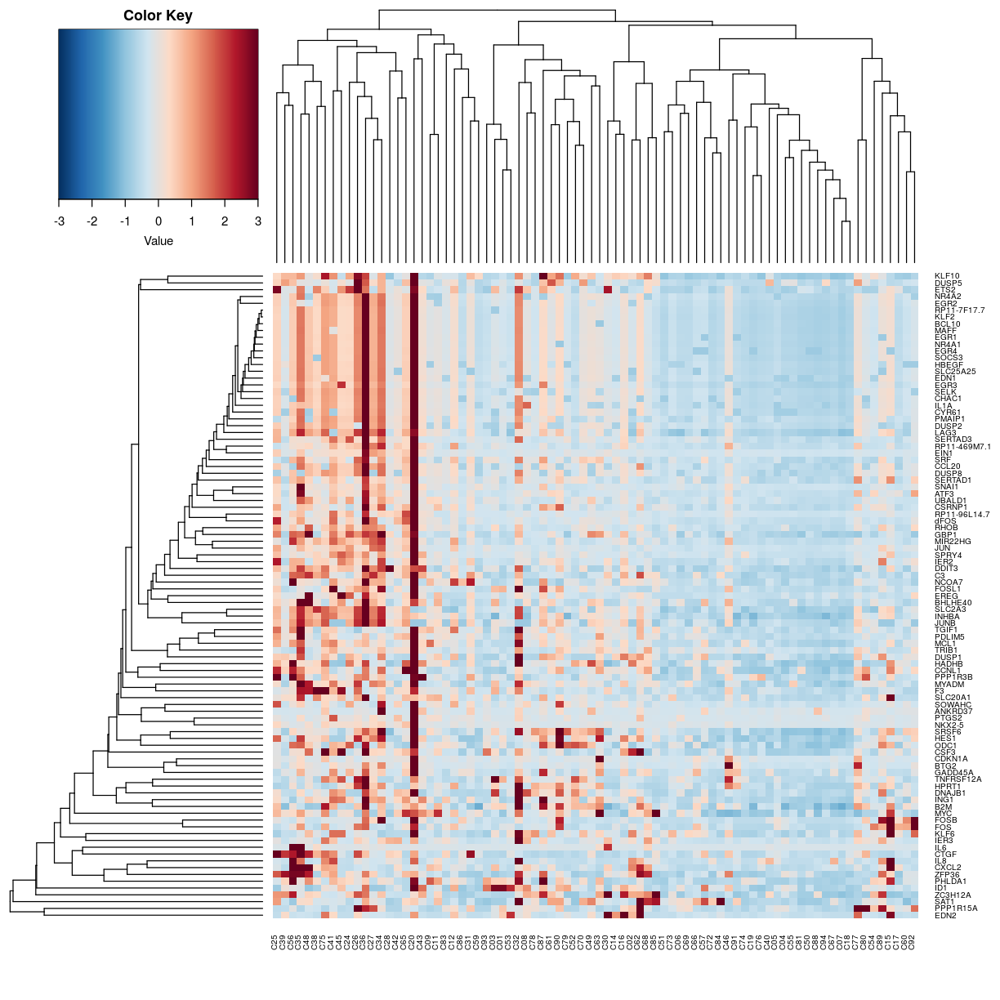

In [76]:
options(repr.plot.width=10.2, repr.plot.height=10.2)
heatplot(t(foldChangeGLUD1Imputed[,colnames(foldChangeGLUD1Imputed) != "GLUD1"]), dend="both", cexRow=0.6, cexCol=0.6)


Relative quantities of cDNA molecule
-------------------------------------------

Although most of the single-cell expression data can be performed directly on Ct values, results might be more intuitive for visualization if expression values are converted to relative copy numbers. Relative quantities of cDNA molecules (RQ) can be calculated as 

$
RQ = 2^{Cq_{cutoff}-Cq}
$

We applied two approaches for the missing value. 

In the First approach when there is no data for the Rq value, we assigne RQ=0.5. Although we cannot have 0.5 molecules in a testtube, we assume that due to sampling ambiguity we cannot conclude a test sample is negative.

In the second approach we again impute the missing Rq value.


Warning message:
In knnimp(x, k, maxmiss = rowmax, maxp = maxp): 28 rows with more than 50 % entries missing;
 mean imputation used for these rows

[1] "Data (original) range:  0.5 75379.44"
[1] "Data (scale) range:  -1.55 8.83"
[1] "Data scaled to range:  -1.55 3"


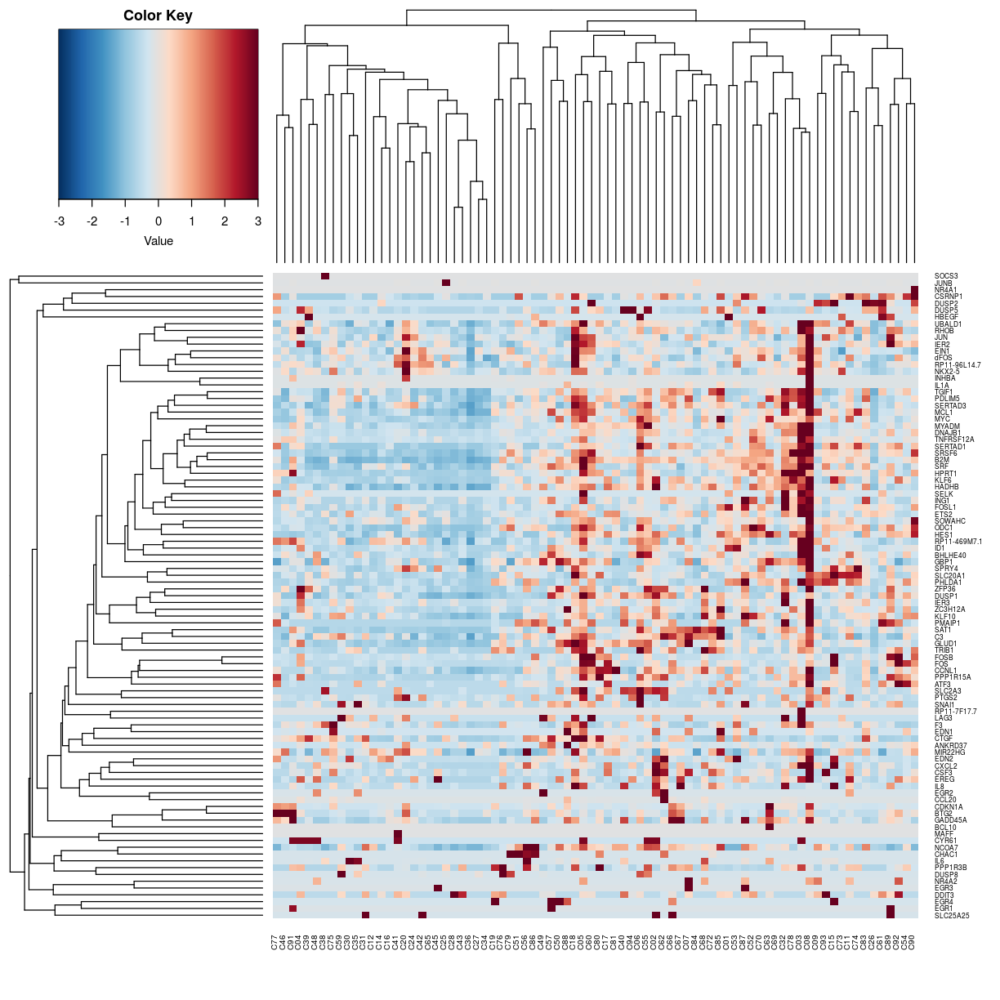

In [78]:

#=================================================================================================
# Calculating the Relative quantities of cDNA molecules (RQ) = 2^(Cq_cutoff - Cq)
#================================================================================================

Ct_cutoff <- 25
CtCutValidCells <- CtValidCells
CtCutValidCells[CtCutValidCells > Ct_cutoff] <- Ct_cutoff
write.csv(CtCutValidCells, "CtCutoff.csv")

RelQuanValidCells <- 2^(Ct_cutoff - CtCutValidCells)
write.csv(RelQuanValidCells, "CtRelativeQuantity.csv")

imputedRelQuanValidCells <- impute.knn(t(RelQuanValidCells))
write.csv(t(imputedRelQuanValidCells$data), "ImputedRelQuantity.csv")

MissingDataValidCells <- RelQuanValidCells
MissingDataValidCells[is.na(MissingDataValidCells)] <- 0.5
write.csv(MissingDataValidCells, "CtMissingData.csv")

# The whole gene KLF2 failed so have to discard it to make the dendrogram
heatplot(t(MissingDataValidCells[,colnames(MissingDataValidCells) != "KLF2"]), dend="both", cexRow=0.5, cexCol=0.6)

#===============================================================================================================

[1] "Data (original) range:  1 75379.44"
[1] "Data (scale) range:  -1.85 8.06"
[1] "Data scaled to range:  -1.85 3"


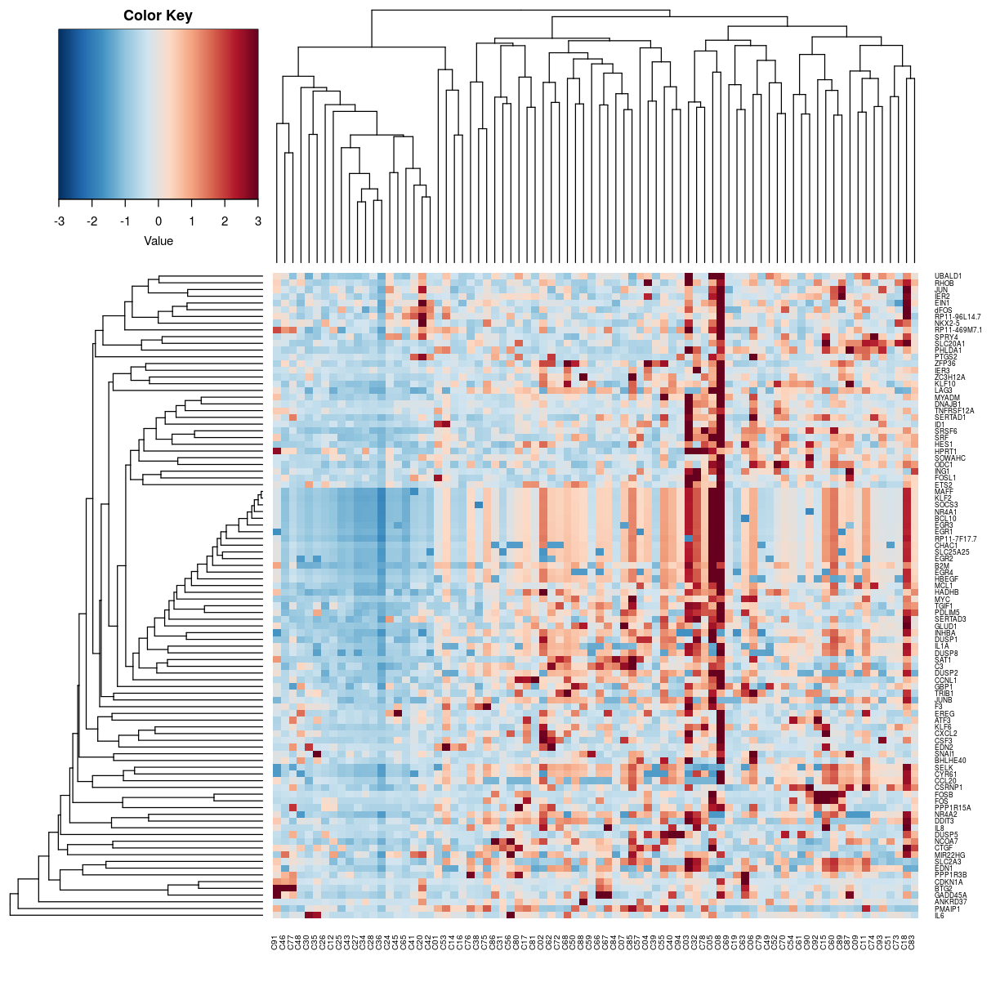

In [80]:
# Dendrogram with imputed Rq value
heatplot(imputedRelQuanValidCells$data, dend="both", cexRow=0.5, cexCol=0.6)


The following objects are masked from mtcars (pos = 3):

    am, carb, cyl, disp, drat, gear, hp, mpg, qsec, vs, wt



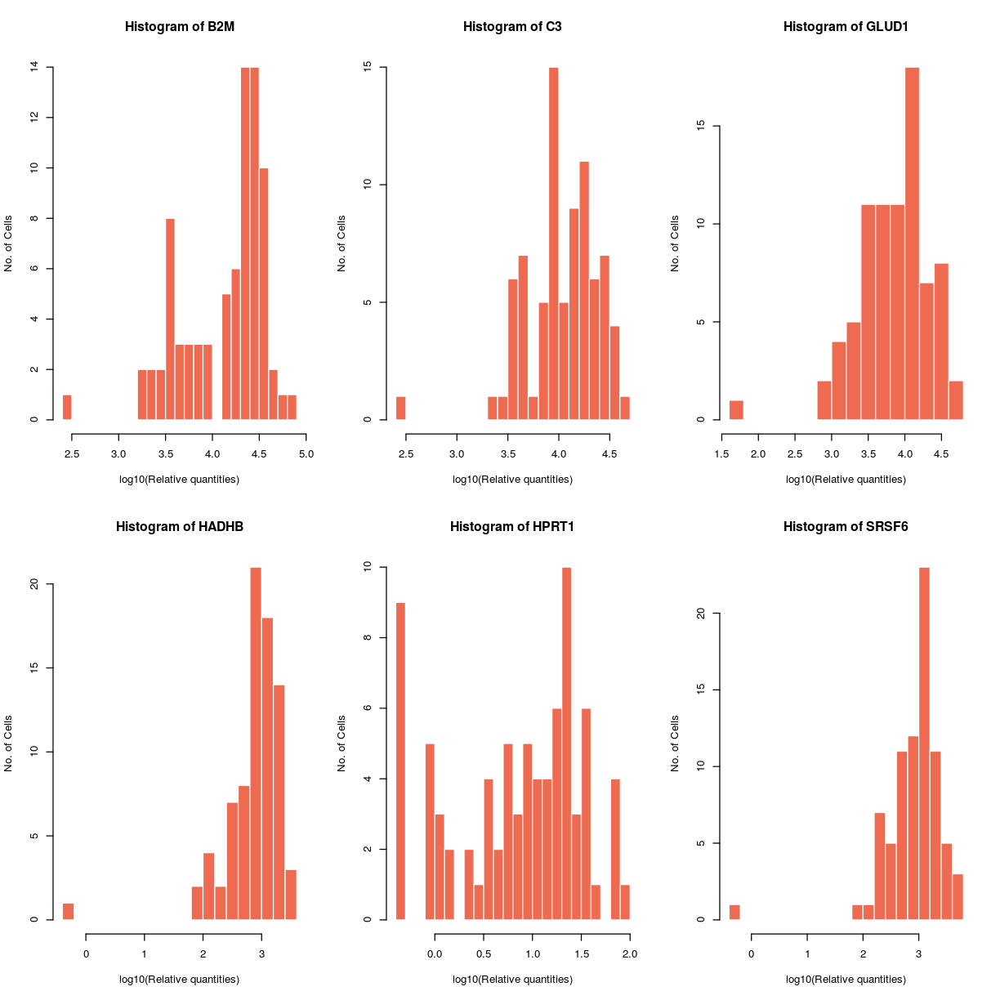

In [2]:
# Histogram of Housekeeping gene
attach(mtcars)
options(repr.plot.width=10.2, repr.plot.height=10.2)
par(mfrow=c(2,3))
for(i in 1:6)
    hist(log10(MissingDataValidCells[,houseKeepGeneIndex[i]]), breaks=20, col="coral2", border="white", xlab = "log10(Relative quantities)", ylab = "No. of Cells", main = paste("Histogram of", colnames(MissingDataValidCells)[houseKeepGeneIndex[i]]))


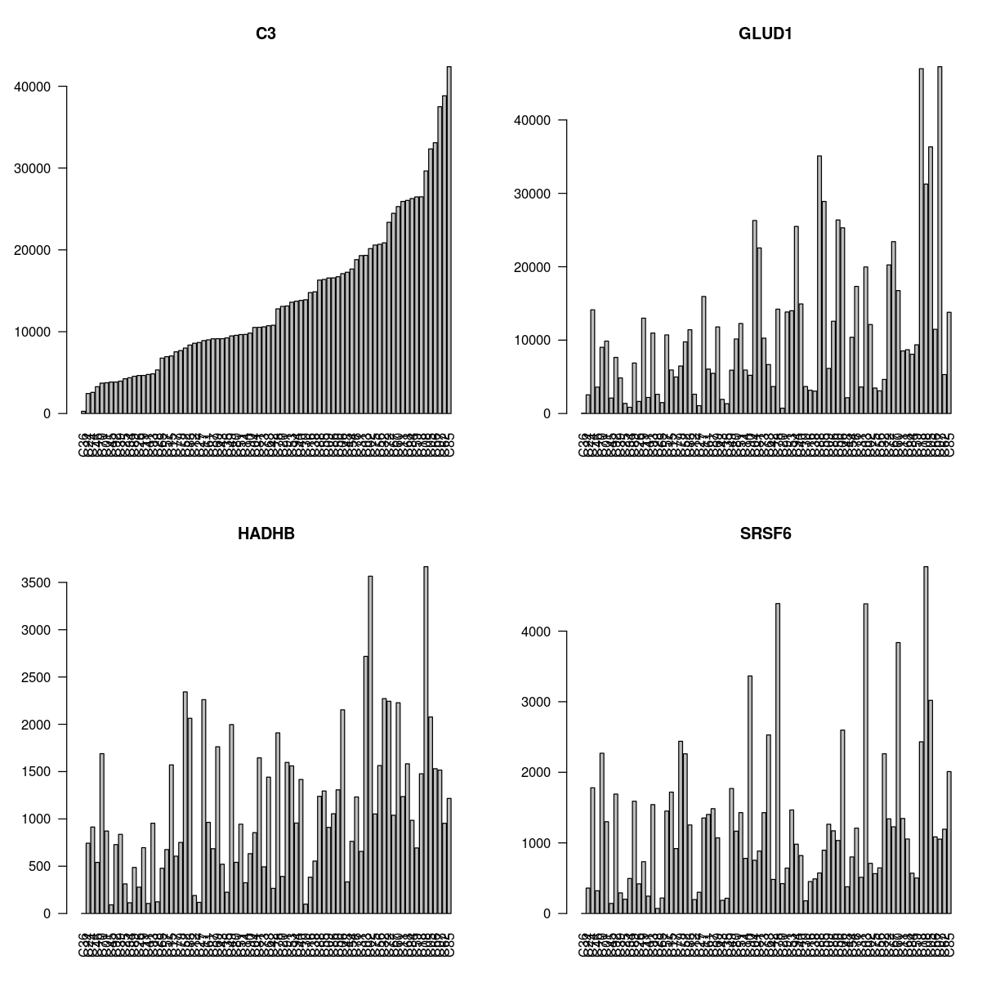

In [3]:
# Ordering the expression values with C3 gene
C3OrderedExpression <- MissingDataValidCells[order(MissingDataValidCells[,7]),houseKeepGeneIndex]
par(mfrow=c(2,2))
barplot(C3OrderedExpression[,2], main=GenName[houseKeepGeneIndex[2]],las=2, cex.lab=0.5)
barplot(C3OrderedExpression[,3], main=GenName[houseKeepGeneIndex[3]],las=2, cex.lab=0.5)
barplot(C3OrderedExpression[,4], main=GenName[houseKeepGeneIndex[4]],las=2, cex.lab=0.5)
barplot(C3OrderedExpression[,6], main=GenName[houseKeepGeneIndex[6]],las=2, cex.lab=0.5)

In [6]:
library(Oscope)
OscopeData <- t(MissingDataValidCells)
#Sizes <- MedianNorm(imputedRelQuanValidCells$data)
#DataNorm<- GetNormalizedMat(imputedRelQuanValidCells$data, Sizes)
Sizes <- MedianNorm(OscopeData)
DataNorm<- GetNormalizedMat(OscopeData, Sizes)

#MV <- CalcMV(OscopeData, Sizes = Sizes)
#str(MV$GeneToUse)
#DataSubset <- DataNorm[MV$GeneToUse,]
#DataInput <- NormForSine(DataSubset)
DataInput <- NormForSine(DataNorm)
SineRes <- OscopeSine(DataInput)
str(SineRes)
#KMRes <- OscopeKM(SineRes, maxK = 10)
KMRes <- OscopeKM(SineRes, quan=.8, maxK = 8)
print(KMRes)
ToRM <- FlagCluster(SineRes, KMRes, DataInput)
print(ToRM$FlagID)
KMResUse <- KMRes[-ToRM$FlagID]
print(KMResUse)
ENIRes <- OscopeENI(KMRes = KMResUse, Data = DataInput, NCThre = 1000)


Loading required package: EBSeq
Loading required package: blockmodeling
Loading required package: gplots

Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess

Loading required package: testthat
Loading required package: cluster
Loading required package: BiocParallel


List of 3
 $ SimiMat : num [1:96, 1:96] 0 -1.5 -1.54 -1.46 -1.45 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:96] "ANKRD37" "ATF3" "B2M" "BCL10" ...
  .. ..$ : chr [1:96] "ANKRD37" "ATF3" "B2M" "BCL10" ...
 $ DiffMat : num [1:96, 1:96] 0 31.4 35 28.8 28.1 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:96] "ANKRD37" "ATF3" "B2M" "BCL10" ...
  .. ..$ : chr [1:96] "ANKRD37" "ATF3" "B2M" "BCL10" ...
 $ ShiftMat: num [1:96, 1:96] 0 5.2 1.25 1.52 1.22 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:96] "ANKRD37" "ATF3" "B2M" "BCL10" ...
  .. ..$ : chr [1:96] "ANKRD37" "ATF3" "B2M" "BCL10" ...


gene pairs above this threshold are considered:
-1.15750830243239
max number of clusters considered:8
optimal number of clusters:5


$cluster1
[1] "BTG2"   "CDKN1A"

$cluster2
[1] "FOS"  "FOSB"

$cluster3
[1] "ODC1"  "SRSF6"

$cluster4
[1] "BCL10"       "CYR61"       "JUNB"        "KLF2"        "MAFF"       
[6] "NR4A1"       "RP11-7F17.7" "SLC25A25"    "SOCS3"      

$cluster5
[1] "dFOS"  "EGR1"  "EGR3"  "EIN1"  "NR4A2"



========= by sine score =========
cluster 1


        0%        25%        50%        75%       100% 
-0.8307766 -0.8307766 -0.8307766 -0.8307766 -0.8307766 


cluster 1 permuted data 


      0%      25%      50%      75%     100% 
-1.48962 -1.48962 -1.48962 -1.48962 -1.48962 


cluster 2


       0%       25%       50%       75%      100% 
-1.020293 -1.020293 -1.020293 -1.020293 -1.020293 


cluster 2 permuted data 


       0%       25%       50%       75%      100% 
-1.456237 -1.456237 -1.456237 -1.456237 -1.456237 


cluster 3


       0%       25%       50%       75%      100% 
-1.157508 -1.157508 -1.157508 -1.157508 -1.157508 


cluster 3 permuted data 


       0%       25%       50%       75%      100% 
-1.472248 -1.472248 -1.472248 -1.472248 -1.472248 


cluster 4


        0%        25%        50%        75%       100% 
-1.0502856 -0.8850470 -0.7567269 -0.5847884  0.3998734 


cluster 4 permuted data 


       0%       25%       50%       75%      100% 
-1.579591 -1.538587 -1.505329 -1.491555 -1.457584 


cluster 5


       0%       25%       50%       75%      100% 
-1.376227 -1.314436 -1.272244 -1.239200 -1.090418 


cluster 5 permuted data 


       0%       25%       50%       75%      100% 
-1.539761 -1.468798 -1.412443 -1.365106 -1.327855 



 flagged cluster:
========= by phase shift =========
cluster 1


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.5498  0.5498  0.5498  0.5498  0.5498  0.5498 


cluster 2


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.574   0.574   0.574   0.574   0.574   0.574 


cluster 3


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.5352  0.5352  0.5352  0.5352  0.5352  0.5352 


cluster 4


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.03859 0.16830 0.16920 0.25850 0.44750 


cluster 5


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.2716  0.4797  0.7088  0.7620  1.1640  1.2570 


flagged cluster:1234


[1] 1 2 3 4
$cluster5
[1] "dFOS"  "EGR1"  "EGR3"  "EIN1"  "NR4A2"



ENI of cluster5; inserting samples:


  |======================================================================| 100%


2-opt of cluster5
updated at iteration 26 ; updated at iteration 166 ; updated at iteration 246 ; updated at iteration 349 ; updated at iteration 356 ; updated at iteration 372 ; updated at iteration 468 ; updated at iteration 510 ; updated at iteration 598 ; updated at iteration 605 ; updated at iteration 628 ; updated at iteration 697 ; updated at iteration 718 ; updated at iteration 759 ; updated at iteration 800 ; updated at iteration 858 ; updated at iteration 867 ; updated at iteration 942 ; updated at iteration 980 ; updated at iteration 982 ; updated at iteration 1023 ; updated at iteration 1074 ; updated at iteration 1205 ; updated at iteration 1284 ; updated at iteration 1352 ; updated at iteration 1478 ; updated at iteration 1497 ; updated at iteration 1521 ; updated at iteration 1619 ; updated at iteration 1735 ; updated at iteration 1756 ; updated at iteration 2233 ; updated at iteration 2270 ; updated at iteration 2289 ; updated at iteration 2298 ; updated at iteration 23

ERROR: Error in KMResUse[[2]]: subscript out of bounds


$cluster5
[1] "dFOS"  "EGR1"  "EGR3"  "EIN1"  "NR4A2"



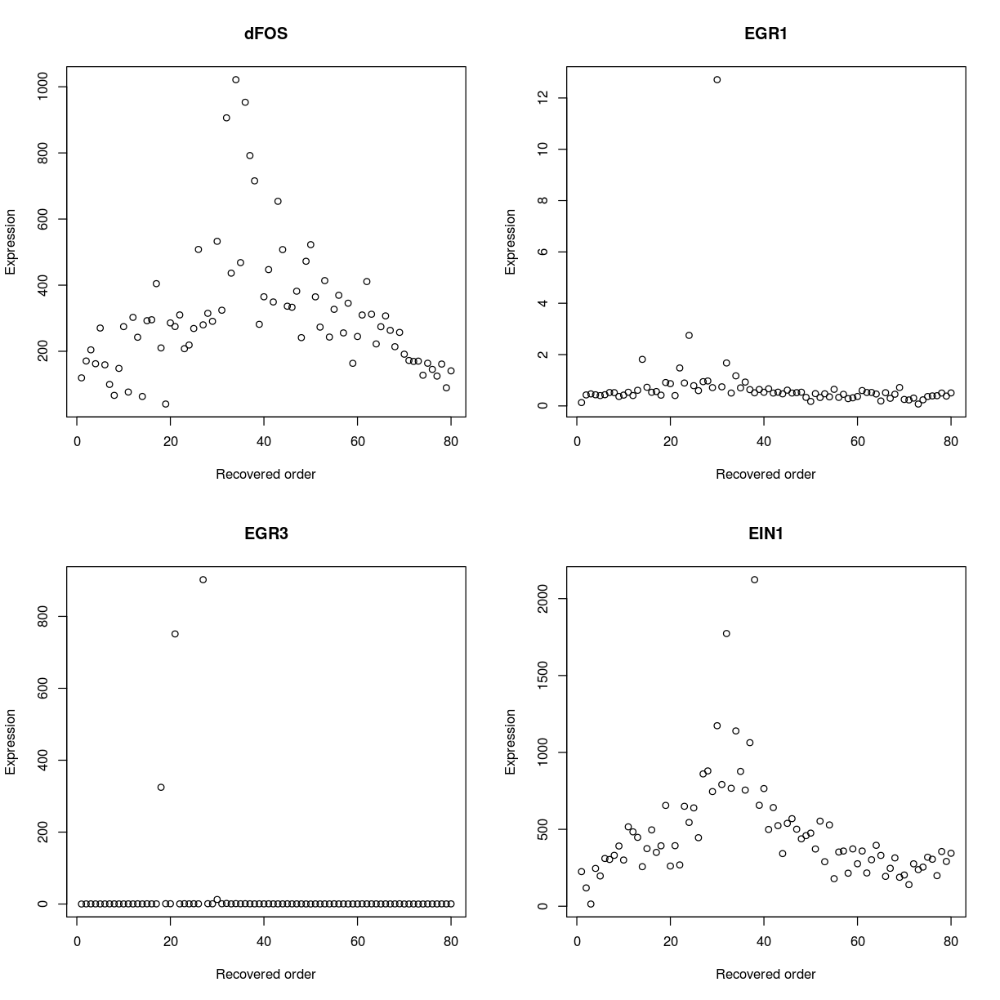

In [8]:
KMResUse <- KMRes[-ToRM$FlagID]
print(KMResUse)
par(mfrow = c(2,2))
for(i in 1:4)
  plot(DataNorm[KMResUse[[1]][i], ENIRes[[1]]],
       xlab = "Recovered order", ylab = "Expression",
       main = KMResUse[[1]][i])